todo :

- Remove noise
    1. explain
    2. explain
    3. explain
    4. explain

- DC
    - Watermark Insertion
        7. explain
        8. explain
    - Watermark Detection
        9. explain

- Morphology
    - Morphology
        0. explain
    - Granulometry
        0. all
- PCA
    - all

In [1]:
import warnings
import cv2
from cv2 import COLOR_BGR2GRAY, getStructuringElement, MORPH_ELLIPSE, erode, dilate, countNonZero, subtract, connectedComponents, imread, cvtColor, COLOR_RGB2LAB, COLOR_LAB2RGB, split, createCLAHE, merge, PCACompute, resize, COLOR_RGB2GRAY, namedWindow, WINDOW_AUTOSIZE, createTrackbar, setMouseCallback, waitKey, destroyAllWindows, getTrackbarPos
from matplotlib.pyplot import figure, subplot, title, axis, imshow, tight_layout, show,hist, plot
from numpy import conj, r_, unravel_index, argpartition, sqrt, sum, copy, nan_to_num, uint8, mgrid, sinc, exp, pi, double, zeros, abs, array, mean, float32, min, max, hstack, vstack, add
from numpy.fft import fftshift, fft2, ifft2, ifftshift
from numpy.random import normal
from scipy.fftpack import dct, idct
from sklearn.cluster import MiniBatchKMeans

warnings.filterwarnings("ignore")

# Project 2
#### IIVP 21-22
#### Giuseppe Lorenzo Pompigna


In [2]:
figure_size = (18,7)
# functions to load/convert/display images, used throughout the whole assignment
def load(keyword, code=None):
    # read image by file
    # if code is 0 it reads the image with grayscale
    i =  imread('images/'+keyword+'.jpg', code)
    if i is None:
        i = imread('images/'+keyword+'.jpeg', code)
    if i is None:
        i = imread('images/'+keyword+'.tif', code)
    if i is None:
        print("Not found any ",keyword," jpg or jpeg")
    return i
def rgb(bgr):
    # convert bgr image to rgb
    return cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
def gray(img):
    return cvtColor(img, COLOR_BGR2GRAY)
def binarize(img, thresh = 180):
    img = img.astype(int)
    m,n,_ = img.shape
    _gray = zeros((m,n), int)
    for i in range(0,m):
        for j in range(0,n):
            _gray[i,j] = 1 if img[i,j,0] > thresh else 0
    return _gray
def show_images(name, images, desc=None, col=None, fig_size=(16, 9)):
    figure(figsize=fig_size)
    n = len(images)
    for i in range(0,n):
        img = images[i].astype(uint8)
        tit ="" if desc is None else name + " " + desc[i]
        if not col is None:
            c = col[i]
            subplot(1,n,i+1), title(tit), axis('off'), imshow(img,cmap=c)
        else :
            subplot(1,n,i+1), title(tit), axis('off'), imshow(img)
    tight_layout()
    show()

# 1 Image degradation
With motion blur and additive noise

Choose one colored image and add **diagonal motion blur** and **additive noise** in the frequency domain

In [3]:
F = rgb(load("bird"))

#### Degrading the image and adding noise
Create a diagonal motion blurring function, apply it to the image in the frequency domain

$$ H(u,v) = sinc( \alpha \cdot u + \beta \cdot v) \cdot exp(-j \pi ( \alpha \cdot u + \beta \cdot v)) $$

In [4]:
alpha = .06
beta = .09

_mean = 0
variance = 25

def diagonal_blur(f, a=alpha, b=beta):
    # function to return the diagonal blurring function given an image to take the shape of,
    # alpha , beta parameters
    m,n,_ = f.shape
    [u, v] = mgrid[-m/2:m/2, -n/2:n/2]
    u = 2*u/m
    v = 2*v/n
    h = sinc((u*a) + (v*b)) * exp(-1j*pi*((u*a) + (v*b)))
    # returns 2d raised mesh as shown in the plot
    fig = figure(figsize=figure_size)
    ax = fig.add_subplot(1,1,1,projection="3d")
    ax.plot_surface(u,v,abs(h)), show()
    return h

def add_diagonal_blur(f, h=None ):
    # get diagonal blur function
    if h is None :
        h = diagonal_blur(f)
    # apply it to the given image in the fourier domain
    # g = apply_filter(f,h)                         # it actually works better when not shifting :/
    g = apply_filter_no_shift(f,h)
    return g , h
def apply_filter(f, h):
    # function to apply a degradation filter function in the frequency domain
    # create out image from f shape
    g = zeros(f.shape, uint8)
    for k in range(0,f.shape[2]):         # iterate per color channel
        c = f[:,:,k]                      # select color layer
        fc = fftshift(fft2(c))            # get ft and center
        fb = fc * h                       # apply degradation function in freq domain
        ifb = ifft2(ifftshift(fb))        # reverse ft
        g[:,:,k] = abs(ifb)               # back to spatial domain

    # debug
    #     subplot(channels,3,k*3+1), imshow(c, cmap='gray')
    #     subplot(channels,3,k*3+2), imshow(log(abs(fc))**2, cmap='gray')
    #     subplot(channels,3,k*3+3), imshow(g[:,:,k], cmap='gray')
    # show()

    return g
def apply_filter_no_shift(f, h):
    # function to apply a degradation filter function in the frequency domain
    # create out image from f shape
    g = zeros(f.shape, uint8)
    for k in range(0,f.shape[2]):         # iterate per color channel
        c = f[:,:,k].astype(uint8)        # select color layer
        fc = fft2(c)                      # get ft without centering
        fb = fc * h                       # apply degradation function in freq domain
        ifb = ifft2(fb)                   # reverse ft
        g[:,:,k] = abs(ifb)               # back to spatial domain

    # debug
    #     subplot(channels,3,k*3+1), imshow(c, cmap='gray')
    #     subplot(channels,3,k*3+2), imshow(log(abs(fc))**2, cmap='gray')
    #     subplot(channels,3,k*3+3), imshow(g[:,:,k], cmap='gray')
    # show()

    return g
def add_gaussian_noise(f, mu=_mean, var=variance):
    # function to apply additive random noise from gaussian distribution with
    # given mean and variance to the given @f image
    # using opencv inbuilt function normal

    g = zeros(f.shape)                                  # out image

    for k in range(0,f.shape[2]):                               # iterate color channels
        c = f[:,:,k]                                            # select color layer
        n = normal(mu, var, c.shape)                            # gather additive noise on each color layer
        fc = fftshift(fft2(c))                                            # ft of the image
        fn = fftshift(fft2(n))                                            # ft of the noise
        fg = fc + fn                                            # apply noise in freq domain
        ifg = ifft2(ifftshift(fg))                                         # inverse ft
        g[:,:,k] = abs(ifg)                                     # back to spatial

    # debug
    #     subplot(channels,3,k*3+1), imshow(c, cmap='gray')
    #     subplot(channels,3,k*3+2), imshow(xn, cmap='gray')
    #     subplot(channels,3,k*3+3), imshow(g[:,:,k], cmap='gray')
    # show()

    return g

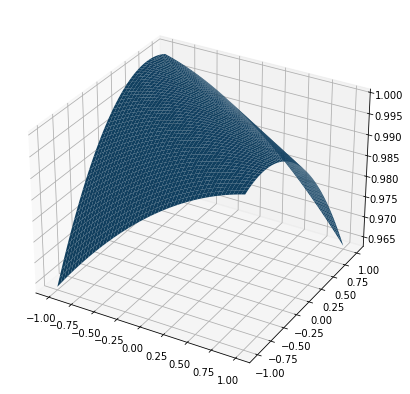

In [5]:
# diagonal motion blur
G, H = add_diagonal_blur(F)
# additive noise
GN = add_gaussian_noise(G)

**Display** (1) image degraded by motion blur,(2) by motion blur and additive noise

As we can see from the above pictures, the diagonal motion blur seems to be working properly,
even though it was applied with no shift in the fourier domain.
As it can be seen in the code, I also tried the same procedure with the shifting,
but the needed alpha and beta values to produce a noticeable difference are higher than in the case without.
Furthermore, I did not manage to get the inverse filter working properly when the blurring is applied in the
shifted fourier domain, hence I just left it with no shift.

Regarding the gaussian noise, it can be seen that when applied in the frequency domain it produces a significantly different
result than when applied in the spatial domain, it indeed changes the colors (like in the yellow aura around the wing),
rather than embedding pixel valued noise.

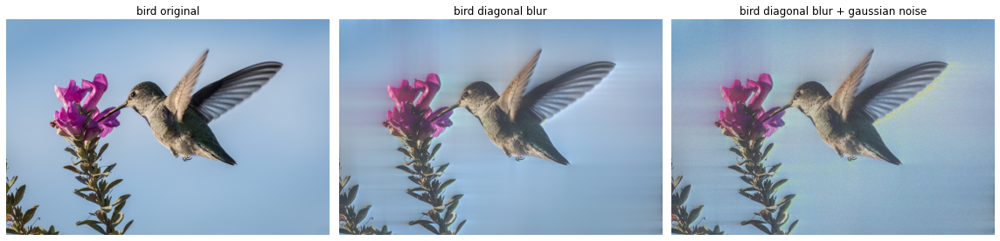

In [6]:
show_images("bird", [F, G, GN], ["original", "diagonal blur", "diagonal blur + gaussian noise"])

## Remove noise
Assume you know H(u,v)

In [7]:
def apply_inverse_filter(g, h):
    # function to apply inverse filtering for motion blur
    r = zeros(g.shape,int)             # out image
    for k in range(0,g.shape[2]):      # loop through colors channels
        c = g[:,:,k].astype(int)       # take color slice
        fc = fft2(c)                   # gather ft and shift to center
        fb = fc/ h                     # inverse operation of the application of this filter
        ifb = ifft2(fb)     # inverse ft
        r[:,:,k] = abs(ifb)            # back to spatial domain

    return r

#### Applying **inverse filter** $ h^{-1} $ on $ G $ .

$ G^{'} = \frac{G(u,v)}{H(u,v)} $

1. $ G $ is the image after **motion blur**
2. $ G $ is the image after **motion blur** and **additive noise**

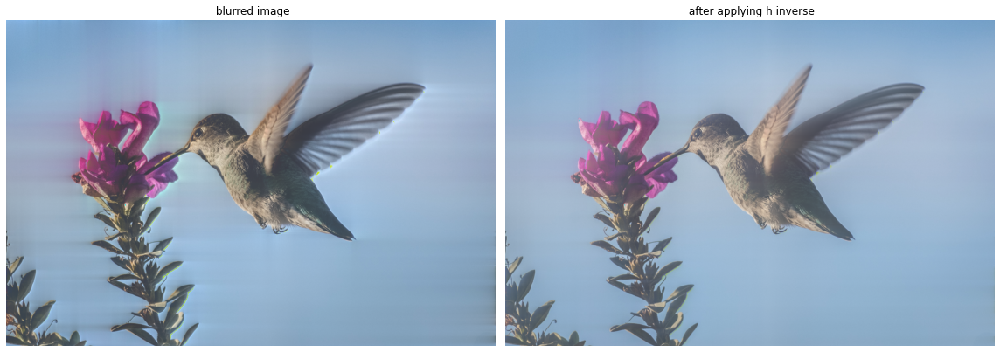

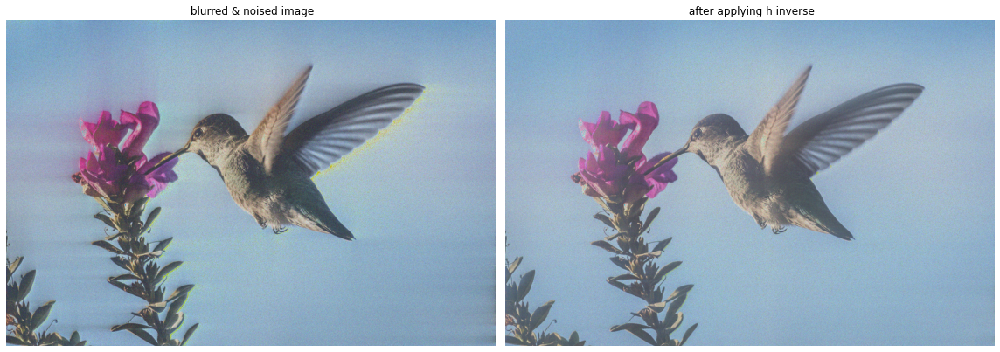

In [8]:
G_ = apply_inverse_filter(G, H)        # 1  motion blurred image
G_N = apply_inverse_filter(GN, H)      # 2  motion blurred and noised image
# showing images
show_images("", [G, G_], ["blurred image", "after applying h inverse"])
show_images("", [GN, G_N], ["blurred & noised image", "after applying h inverse"])

As shown above, the filterd images looks fairly good.
The diagonal motion blur is removed just by inverting the blurring procedure,
and regarding the gaussian noise, it is only spread in the image, rather than removed.
We can indeed notice the restored images aren't completely similar to the original one.
The second one, where the noise is not removed by the filter, we can see some yellow shadows.

#### Write the equation for the **MMSE** filter $ H_w (u,v) $ when there is only additive noise

In [9]:
def mmse_filter_noise(f, fn):

    r = zeros(f.shape, int)          # out image
    n = fn-f                         # noise by difference between noised image & original image

    for k in range(0,f.shape[2]):
        fs = abs(fftshift(fft2(f[:,:,k]))) ** 2         # original image power spectrum
        ns = abs(fftshift(fft2(n[:,:,k]))) ** 2         # noise power spectrum
        fns = fftshift(fft2(fn[:,:,k]))                 # noised image tf
        # assume h = 1 then
        hw = 1 / (1 + (ns/fs))                          # filter h function
        fr = fns * hw                                   # apply filter in fourier domain
        ifr = ifft2(ifftshift(fr))                      # inverse tf
        r[:,:,k] = abs(ifr)                             # back to spatial domain

    return r

#### Apply this **MMSE** filter $ H_w (u,v) $

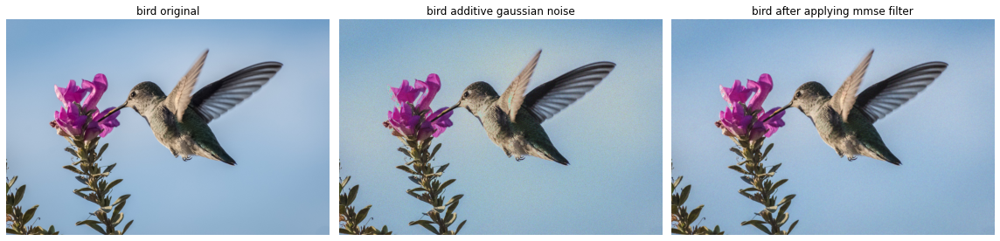

In [10]:
FN = add_gaussian_noise(F)          # only additive noise asked (could have used the restored image but im recycling the function)
FN_ = mmse_filter_noise(F, FN)            # we get back FN_ which is the restored image and N which is the noise
# showing images
show_images("bird", [F,FN, FN_], ["original","additive gaussian noise", "after applying mmse filter"])

The MMSE filter works indeed for the gaussian noise, as it has removed all the noise in the colors.
The restored image looks bright and similar to the original one.

#### Write the equation for the **MMSE** filter $ H_w $ when there motion blur and additive noise
Approximate the ratio of the noise power spectrum to original image power spectrum by a constant $ K = \frac{S_{nn}(u,v)}{S_{ff}(u,v)} $

Calculate $ K $ from the average of their true ratio

In [11]:
def mmse_filter_complete(f, h, g):
    r = zeros(f.shape, int)     # out image
    n = g-f                     # noise estimation by difference with original image

    for j in range(0, f.shape[2]):                   # loop through color layers
        fs = abs(fft2(f[:,:, j])) ** 2               # original image power spectrum
        ns = abs(fft2(n[:,:, j])) ** 2               # noise power spectrum
        _k = ns / fs                                 # k - power spectrum ratio
        dh = abs(h) ** 2 + _k                        # wiener filter den
        hw = conj(h) / dh                            # filter h function
        gs = fft2(g[:,:, j])                         # tf of the noised image
        fr = gs * hw                                 # apply filter in frequency domain
        ifr = ifft2(fr)                              # inverse tf
        r[:,:, j] = abs(ifr)                         # back to spatial domain

    return r

#### Apply the resulting **MMSE** filter $ H_w $ to the image
after it has undergone motion blur and additive noise

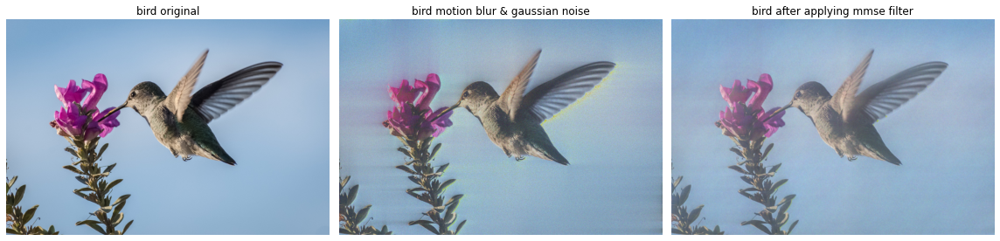

In [12]:
GN_ = mmse_filter_complete(F, H, GN)
show_images("bird", [F,GN, GN_], ["original","motion blur & gaussian noise", "after applying mmse filter"])


Here the MMSE filter performs still good, we can see the diagonal blur and the gaussian noise
are almost completely removed, but due to the operations being applied on the frequency domain we
cannot 100% restore the image when noise is applied. (even if the distribution is identical)

# 2. Hiding secret message in DCT

In [13]:
def dct2(a):
    # 2-D DCT tf
    return dct(dct(a.T, norm='ortho').T, norm='ortho')
def idct2(a):
    # 2-D DCT inverse tf
    return idct(idct(a.T, norm='ortho').T, norm='ortho')
def extract_dct(img):
    # extract 8x8 2-D DCT coefficients
    dct_blocks = zeros(img.shape)            # out shape
    for i in r_[:img.shape[0]:8]:            # block-wise dct
        for j in r_[:img.shape[1]:8]:
            dct_blocks[i:i + 8, j:j + 8] = dct2(img[i:i + 8,j:j + 8])

    return dct_blocks
def k_largest_values(a, _k):
    # stretch the array
    # sort by values and gather indexes
    # gather last K-1 indexes from sorted array
    # reshape indexes and gather values from them
    k_dcts = zeros(a.shape)

    for i in r_[:a.shape[0]:8]:
        for j in r_[:a.shape[1]:8]:
            block = copy(a[i:i+8 , j:j+8])                  # non -dc
            flat = abs(block).ravel()
            highest_k = unravel_index(argpartition(flat,-_k)[-_k:], block.shape)
            filtered = zeros(block.shape)
            filtered[highest_k] = block[highest_k]
            k_dcts[i:i+8 , j:j+8] = filtered
            k_dcts[i,j] = block[0,0]


    print("%d non-zero coefficients " %k_dcts[k_dcts != 0].__len__())

    return k_dcts
def find_best_k_dct(_dct, img, debug=False):
    size = img.shape
    _K_dct = None           # out params
    _K = -1

    for _k in range(24,0,-4):                         # testing range
        _restored = zeros(size)                        # out image
        k_dcts = k_largest_values(_dct, _k)             # indexes of highest K coefficients
        for i in r_[:size[0]:8]:                      # block-wise idct from filtered coefficients
            for j in r_[:size[1]:8]:
                _restored[i:(i+8),j:(j+8)] = idct2(k_dcts[i:(i+8),j:(j+8)] )

        if debug:                               # some debug
            figure(figsize=(20,10))
            subplot(1,3,1), axis('off'), imshow(hstack((img, _restored)) ,'gray',vmin=0,vmax=255), title("original - restored")
            subplot(1,3,2), axis('off'), imshow(abs(img - _restored), 'gray'), title("difference image")
            subplot(1,3,3), imshow(hstack((_dct, k_dcts)) ,'gray',vmin=0,vmax=max(k_dcts)*0.01), title("all dct - %d dct" %_k)
            show()

        if _k == 16 :                           # best one found by inspection
            _K = _k                               # store out params
            _K_dct = k_dcts

    return _K, _K_dct
def embed(_k_dct, s, a):
    # generate K random numbers from gaussian distribution with mean 0 and var s
    size = _k_dct.shape
    _wk = zeros(size)
    _marked = zeros(size)


    for i in r_[:size[0]:8]:
        for j in r_[:size[1]:8]:
            block = _k_dct[i:i+8, j:j+8]
            gaussian = normal(0,s,block.shape[0] * block.shape[1]).reshape(block.shape)
            _wk[i:i+8, j:j+8] = gaussian
            _marked[i:i+8, j:j+8] = nan_to_num(block * (1 - a * gaussian))
            _marked[i,j] = block[0,0]                       # put dc component back

    return _wk, _marked
def insert_watermark(img, _k_dct, s, a, debug=False):
    # embed watermark from K largest non-DC DCT coefficients
    _wk, _marked = embed(_k_dct, s, a)                      # from gaussian
    _restored = zeros(sz)                                  # out image

    for i in r_[:sz[0]:8]:              # block-wise idct
        for j in r_[:sz[1]:8]:
            _restored[i:(i+8),j:(j+8)] = idct2(_marked[i:(i+8),j:(j+8)])

    diff = abs(img-_restored)                 # gather difference

    if debug:                           # some debug + display asked
        print("\nTesting sigma=%f , alpha=%f \n" %(s,a))
        figure(figsize=figure_size)
        subplot(2,2,1), axis("off"), title("Original") , imshow(img, cmap='gray')                  # the original image
        subplot(2,2,2), axis("off"), title("Image with watermark") , imshow(_restored, cmap='gray') # the watermarked image
        subplot(2,2,3), axis("off"), title("Difference image") , imshow(diff, cmap='gray')         # the difference image
        subplot(2,2,4), title("histogram difference") , hist(diff)                                 # the histogram of the difference image
        show()

    return _wk, _marked, _restored

## 2.1 Watermark insertion
Chose a *_grayscale_* image to which will insert a watermark

##### Compute the 2-D DCT of the image in a block-wise manner.

In [14]:
image = load("cameraman", 0)
sz = image.shape
all_dct = extract_dct(image)

##### Choose its $ K $ coefficients, $ c_1 , c_2 ,..., c_K $
with the largest magnitude, choose K such that creates an image that
still looks like the original one, just using fewer DCT coefficients

24576 non-zero coefficients 


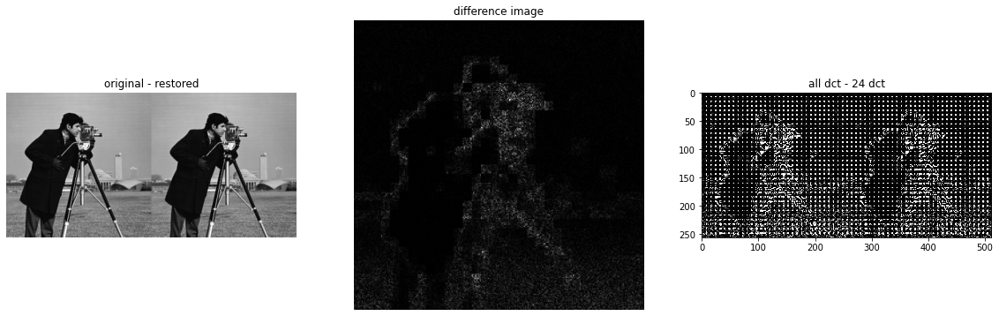

20480 non-zero coefficients 


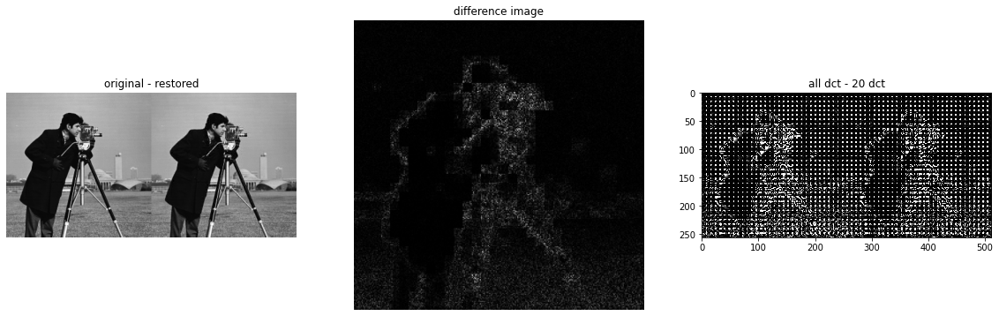

16384 non-zero coefficients 


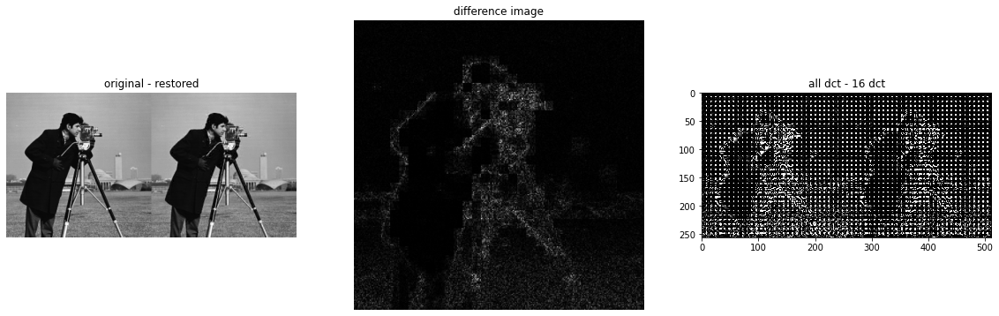

12288 non-zero coefficients 


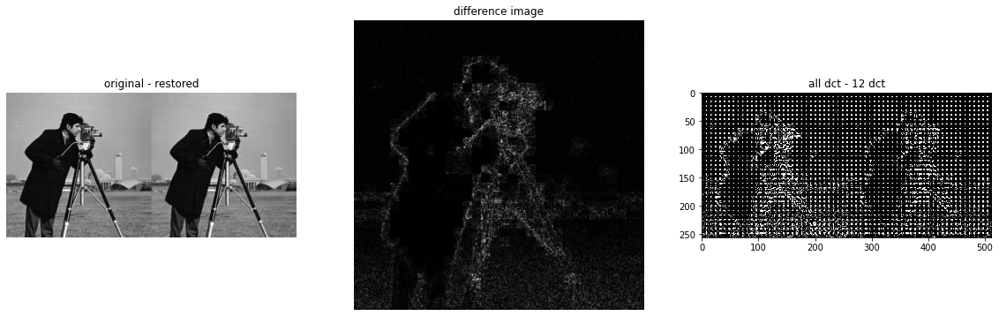

8192 non-zero coefficients 


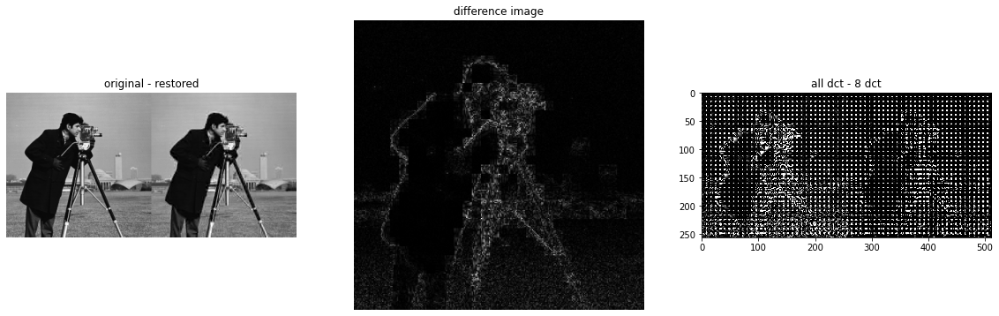

4096 non-zero coefficients 


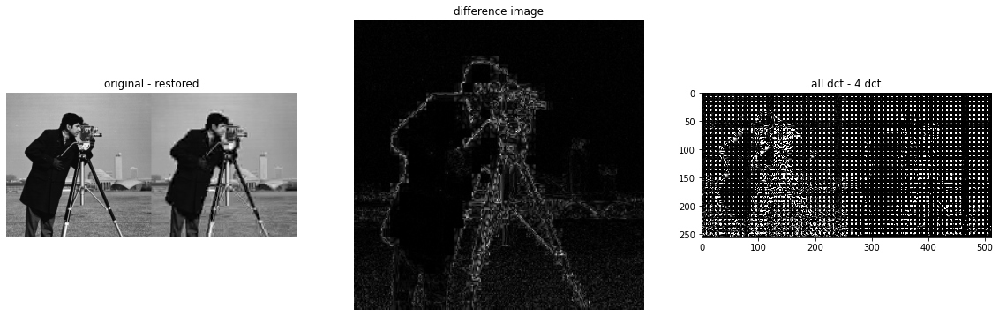

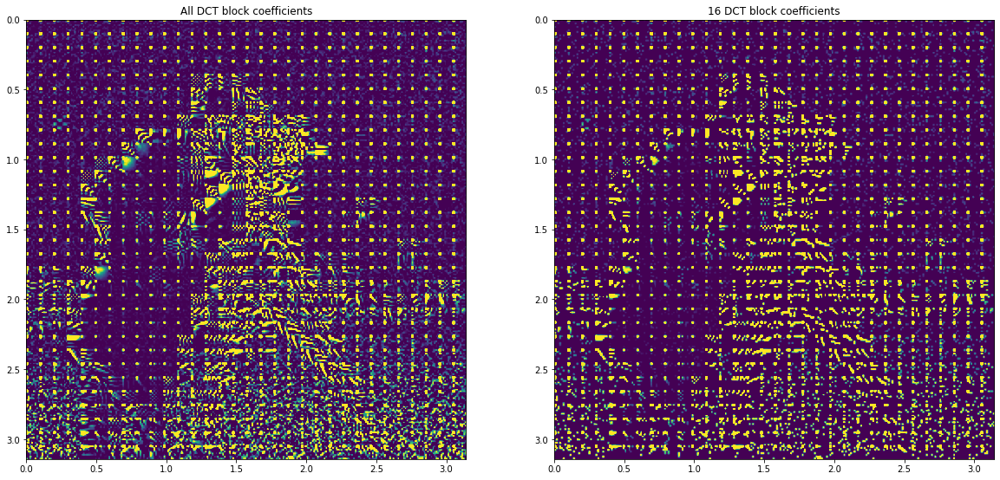

In [15]:
# testing
K, K_dct = find_best_k_dct(all_dct, image, debug=True)

figure(figsize=(20,10))
subplot(1,2,1), imshow(all_dct, vmax= max(all_dct) * 0.01,vmin = 0, extent=[0,pi,pi,0]), title( "All DCT block coefficients")
subplot(1,2,2), imshow(K_dct, vmax=max(K_dct) * 0.01, vmin = 0, extent=[0, pi, pi, 0]), title("%d DCT block coefficients" % K)
show()

As we can see it is possible to reduce the size of the image by using a lower amount
of DCT components. For example we can see the image with 64 or 16 components look
fairly similar.
When we indeed look at the differences in the blocks coefficients we can barely notice any difference between
the two.

##### Create a watermark by generating K-element pseudo-random numbers,
$ w_1, w_2, ..., w_K $ that follow a Gaussian distribution with mean $ \mu = 0 $ and
variance $ \sigma ^2 $ to be chosen


Testing sigma=0.010000 , alpha=0.100000 



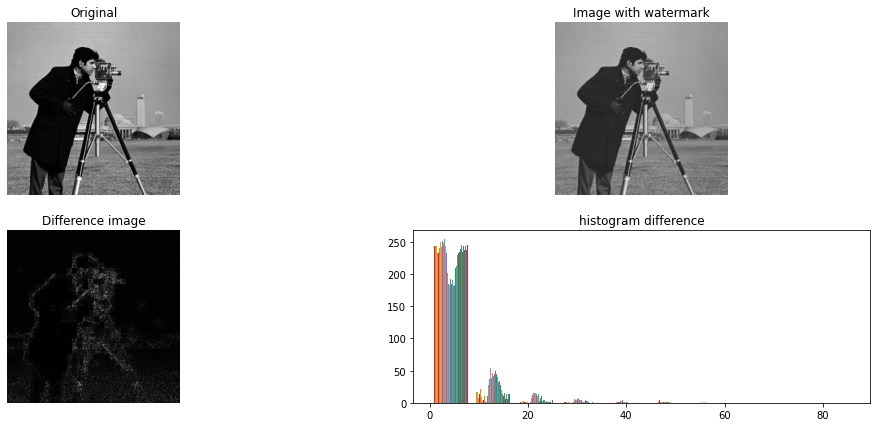


Testing sigma=0.100000 , alpha=0.100000 



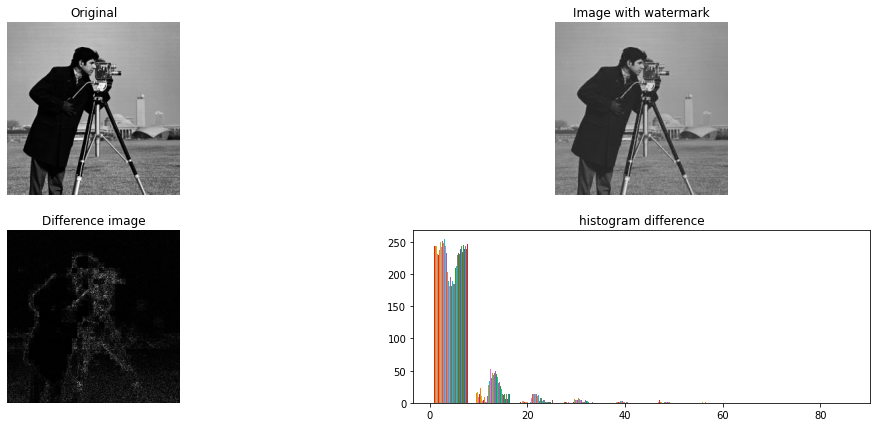


Testing sigma=0.500000 , alpha=0.100000 



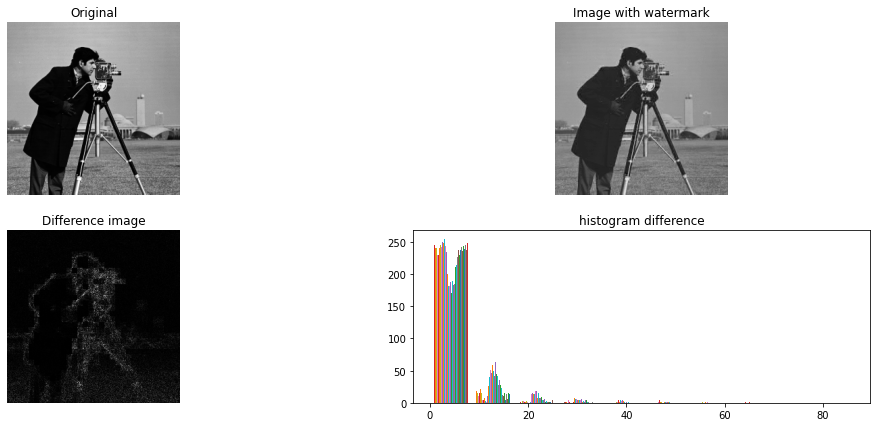


Testing sigma=0.010000 , alpha=0.250000 



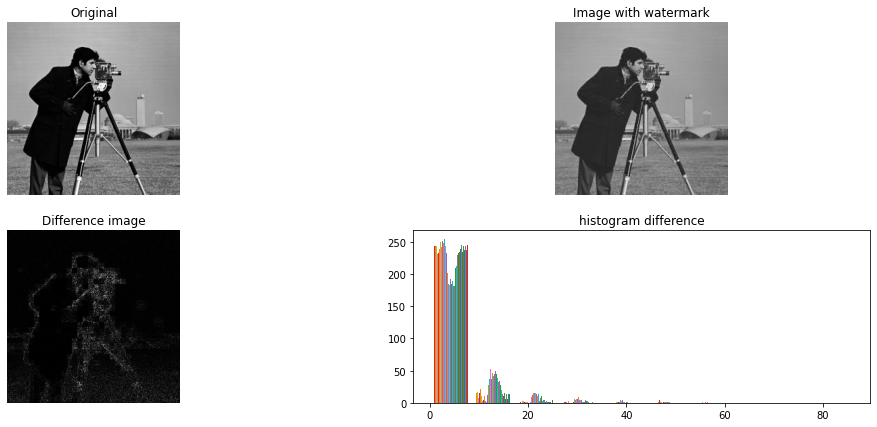


Testing sigma=0.100000 , alpha=0.250000 



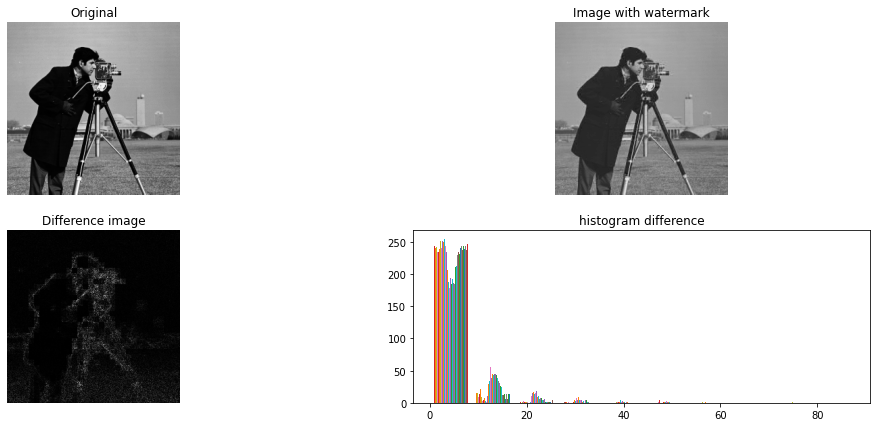


Testing sigma=0.500000 , alpha=0.250000 



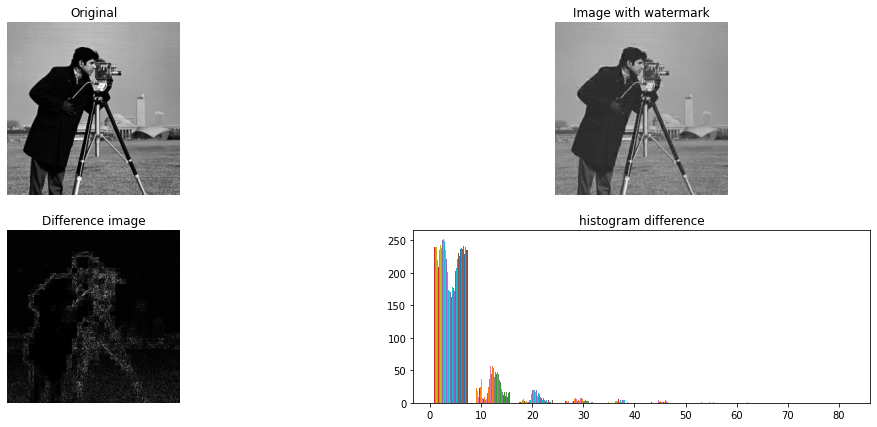


Testing sigma=0.010000 , alpha=0.500000 



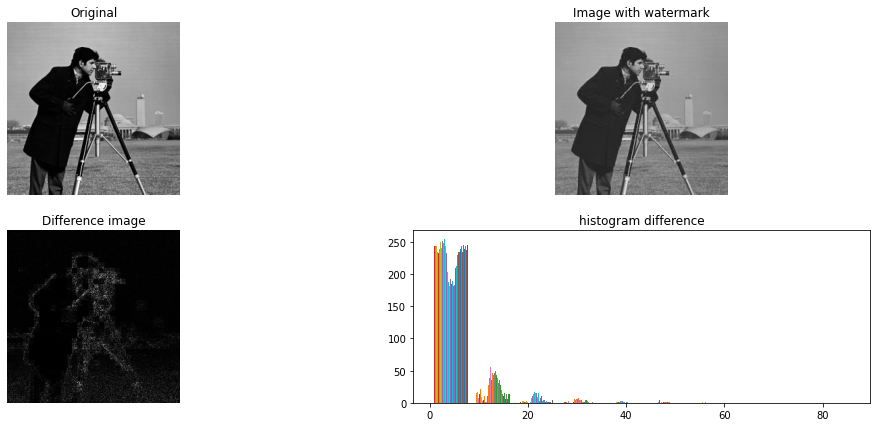


Testing sigma=0.100000 , alpha=0.500000 



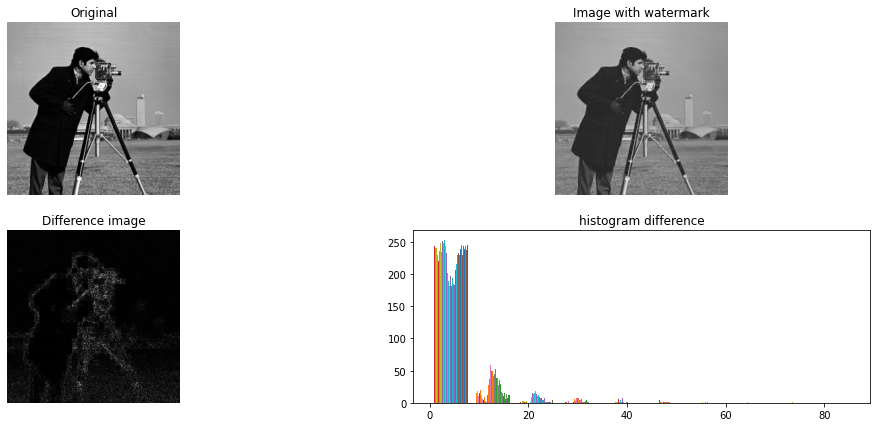


Testing sigma=0.500000 , alpha=0.500000 



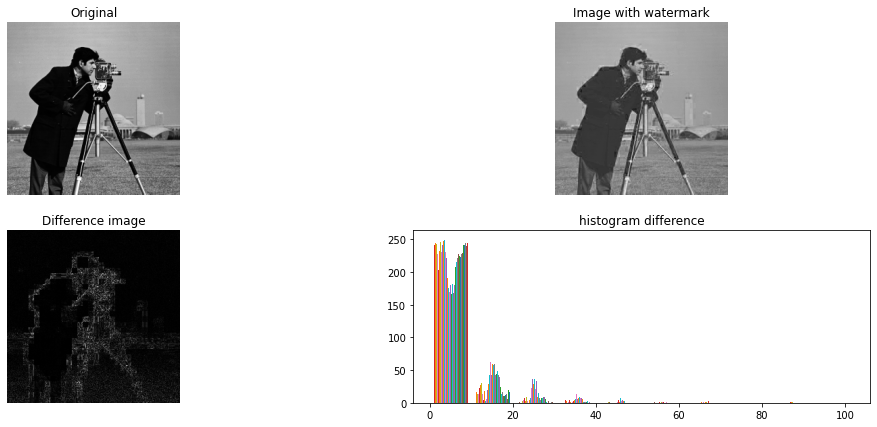

In [16]:
#testing some alpha and sigma params
for alpha in [0.1, 0.25, 0.5]:
    for sigma in [0.01, 0.1, 0.5]:
        _,_,_ = insert_watermark(image, K_dct, sigma, alpha, debug=True)        # set test true

Here I have tested some sigma and alpha values, I can't really conclude anything significant out of this,
if not that having high alpha will highly alter the image, and especially if the variance in the noise is
high (as shown in the x values in the histograms) the image looks way more alterated, even if the alpha value
is low.

##### Steps
Embed the watermark,
Create the DCT of the watermarked image,
Compute the inverse DCT of the DCT with the new coefficients $ c^{'}_i $ ,
Display the original, the watermarked, their difference image
(explained where the code is)

In [17]:
# keeping watermarked image with :
sigma = 0.05
alpha = 0.1
wk, marked, restored = insert_watermark(image, K_dct, sigma, alpha)     # gather marked image and w_k

##### Explain results
After testing some sigma and alpha values, I decided to keep them low, to not alter the image,
especially considering the fact that I'm keeping the 16 highest coefficients only
We can see that when we keep them low, we get a watermarked image which is not very different
from the original one.
Indeed, the purpose of the DCT conversion is to decrease the size of the stored image,
and therefore the aim should be to decrease the size of the dct blocks used

##### Explain why you do not put a watermark on the DC coefficients
Obviously, due to the DC coefficient being the highest value in the block, it contains the
highest percentage of the information in that specific block. Therefore, altering that value,
will produce an alteration in the whole block exponentially higher than when it's not considered.


## 2.2 Watermark Detection

In [18]:
def correlation_coefficient(wi, wi_hat):
    wi_mean = mean(wi); wi_hat_mean = mean(wi_hat)
    s1 = 0; s2 = 0; s3 = 0
    for i in r_[:sz[0]:8]:
        for j in r_[:sz[1]:8]:
            _wi = wi[i:i+8, j:j+8]; _wi_hat = wi_hat[i:i+8, j:j+8]
            # _wi = wi[i+1:i+8, j+1:j+8]; _wi_hat = wi_hat[i+1:i+8, j+1:j+8]

            _wk = _wi - wi_mean; _wk_hat = _wi_hat - wi_hat_mean
            s1 += sum(_wk * _wk_hat)
            s2 += sum(_wi_hat ** 2)
            s3 += sum(_wi ** 2)


    gamma = nan_to_num(s1 / sqrt(s2 * s3))
    print(gamma)
    watermark = gamma > 0.8                               # gamma > 0.8 , watermark is present
    return gamma, watermark
def estimate_watermark(m):
    show_images("mistery",[m],['image'],['gray'])
    all_dcts_hat = extract_dct(m)                      # compute 2-D DCT coefficients
    k_dcts_hat = k_largest_values(all_dcts_hat, 16)
    _wk_hat = zeros(wk.shape)
    # C_i, alpha, K are known from before

    for i in r_[:sz[0]:8]:
        for j in r_[:sz[1]:8]:
            block_hat = k_dcts_hat[i:i+8, j:j+8]
            block = K_dct[i:i+8, j:j+8]
            _wk_hat[i:i+8,j:j+8] = (block_hat - block) / (alpha * block)
            _wk_hat[i,j] = 0


    # measure the similarity of the coefficients

    gamma, watermark = correlation_coefficient(wk, _wk_hat) # compare similarity with threshold
    print("Correlation coefficient : %f" % gamma) # return whether watermark is present
    print("Does the image contain watermark ? %s" % watermark) # return whether watermark is present
    return watermark

You will be given a mistery image, and you will have to find if it is watermarked, comparing it with the known image.
Consider 2 Cases

#### Mistery image is the watermarked image

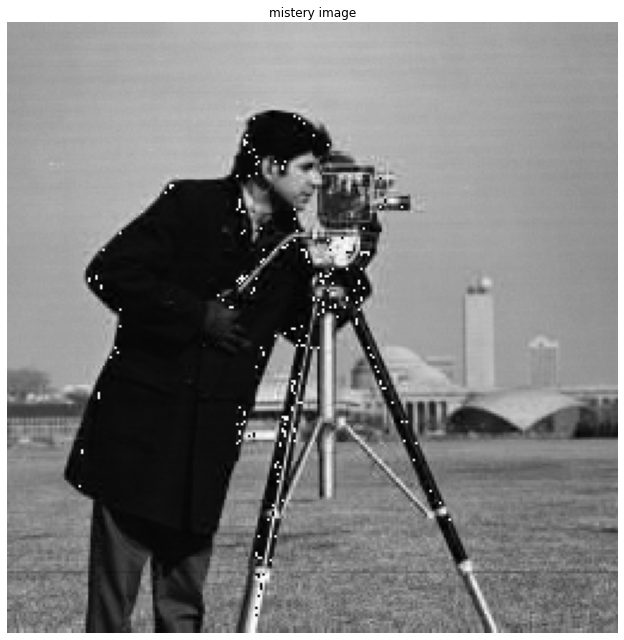

16384 non-zero coefficients 
0.0
Correlation coefficient : 0.000000
Does the image contain watermark ? False


In [19]:
mistery1 = restored
marked1 = estimate_watermark(mistery1)

#### Mistery image is the original image

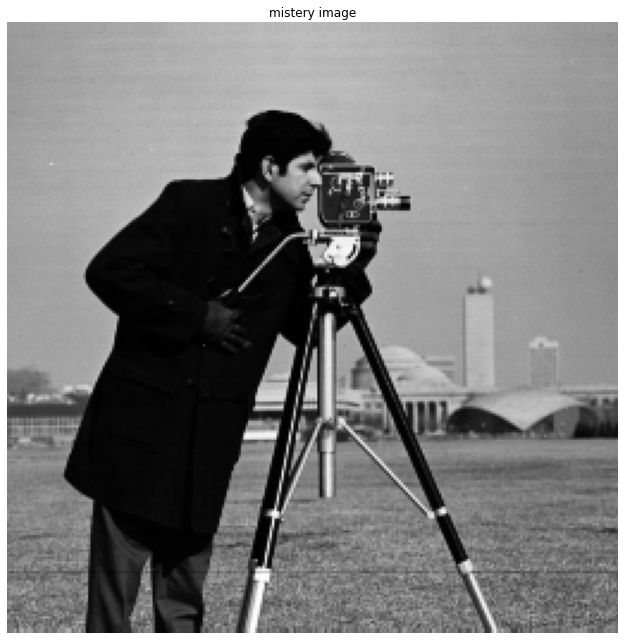

16384 non-zero coefficients 
0.0
Correlation coefficient : 0.000000
Does the image contain watermark ? False


In [20]:
mistery2 = image
marked2 = estimate_watermark(image)

#### Show and explain results

Well, here I didn't get the expected gamma from the two images, due to the lack of time I'm not able
to fix the issue, although it is expected a high gamma value from the watermark image (approximately 1), and
a low gamma value from the non watermarked image (approximately 0)

In [21]:
print(marked1, marked2)


False False


# 3. Morphology
## 3.1 Count oranges
Choose 2 images,
Convert them into black and white, by an empirically determined threshold to binarize them

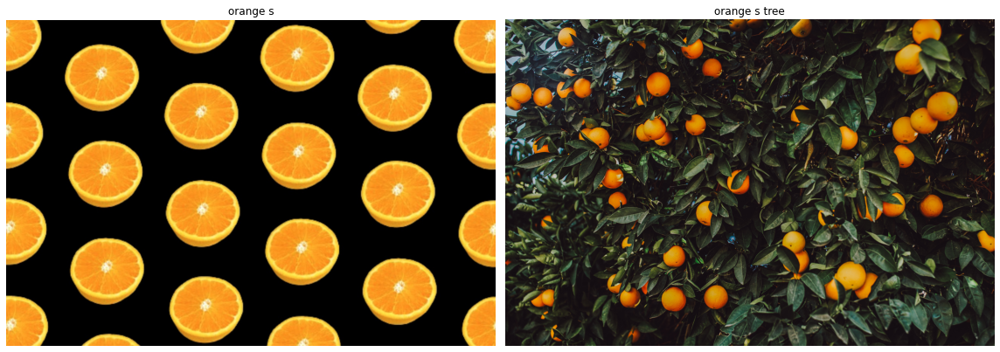

In [22]:
image1 = rgb(imread("images/oranges.jpg"))
image2 = rgb(imread("images/orangetree.jpg"))
show_images("orange",[image1,image2],["s", "s tree"])

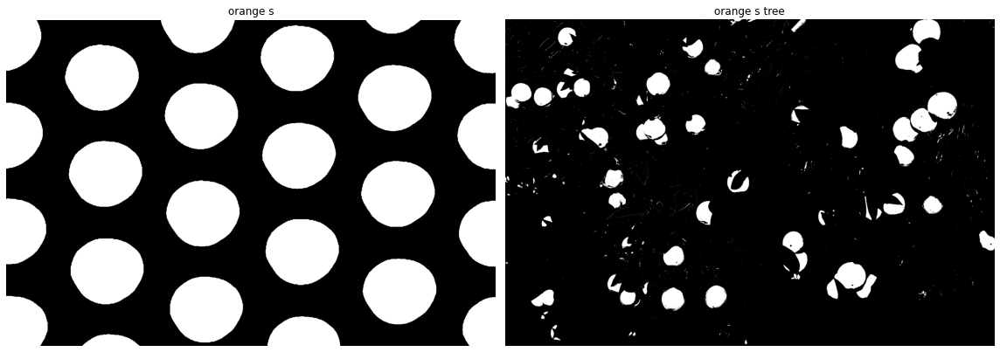

In [23]:
# empirical threshold
orange1 = binarize(image1)
orange2 = binarize(image2)
show_images("orange",[orange1,orange2],["s", "s tree"],['gray','gray'])

In [4]:
def morphological_open(img, k, dtype=uint8, debug=False):
    img = img.astype(dtype)
    kernel = getStructuringElement(MORPH_ELLIPSE, (k,k))
    eroded = erode(img,kernel)
    dilated = dilate(eroded, kernel)
    pix_sum = countNonZero(dilated)
    diff = subtract(img,dilated)

    if debug:
        subplot(1,3,1), axis('off'), title('orig'), imshow(img,'gray')
        subplot(1,3,2), axis('off'), title('eroded'), imshow(eroded,'gray')
        subplot(1,3,3), axis('off'), title('dilated'), imshow(dilated,'gray')
        show()

    return eroded, dilated, pix_sum, diff

def morphological_close(img, k, dtype=uint8, debug=False):
    img = img.astype(dtype)
    kernel = getStructuringElement(MORPH_ELLIPSE, (k,k))
    dilated = dilate(img, kernel)
    eroded = erode(dilated,kernel)
    pix_sum = countNonZero(dilated)
    diff = subtract(img,dilated)

    if debug:
        subplot(1,3,1), axis('off'), title('orig'), imshow(img,'gray')
        subplot(1,3,2), axis('off'), title('eroded'), imshow(eroded,'gray')
        subplot(1,3,3), axis('off'), title('dilated'), imshow(dilated,'gray')
        show()

    return eroded, dilated, pix_sum, diff

In [5]:
# here i created this basic procedure to evaluate the sizes of the needed
# se components for each image, to then use that for the counting procedure
def test_se_sizes(bw_img,r,dtype=uint8,debug=False):
    sums = []; diffs = []; sizes = []
    # given a range r, which determines the sizes to test the SE with
    # start from the lowest size, and increase it gradually
    for i in range(0,len(r)):
        sizes.append(r[i])                                   # testing SE size r[i]
        _,_,s,_ = morphological_open(bw_img,r[i],dtype,debug)      # apply open morphological operation to better separate distinct objects
        sums.append(s)                                       # collect surface area of the opened image

    for i in range(0,len(sums)-1):                            # sum adjacent elements between areas collected
        diffs.append(abs(sums[i]-sums[i+1]))

    title("difference open"), plot(sizes[:-1], diffs), show() # show plot of differences


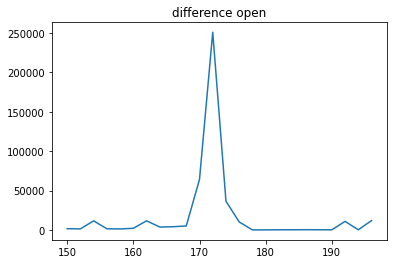

In [26]:
test_se_sizes(orange1,r = range(150,200,2))

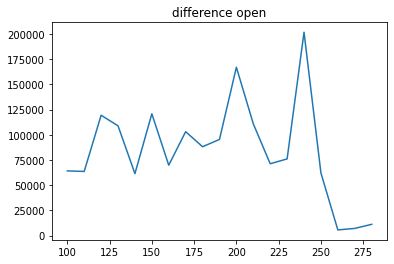

In [27]:
test_se_sizes(orange2,r = range(100,300,10))

As we can see from the plots, the peaks in the function given by the procedure above described will
represent the point in which changing the size of the SE component used for the analysis, leads to a drastic
reduction in the number of object restored after applying erosion, and then dilation.

This is indicating that the SE size being used, exceeds the size of the objects we are trying to identify,
and therefore, these gets depleted by erosion, without any chance for dilation to recover them, e.g.

Assume that starting with SE size $S = X1$ , we can still see all the objects in the image after open morphological operation.
Then let $ X2 = X + k $  where $ k > 0 $,
Assume that using $ S = X2 $ we can't see anymore the objects in the image after open morphological operation,
Then it means that the objects we are looking for have size $ X1 < Sx < X2 $

Hence, by subtracting the surface area generated by the opened image and making a ratio between the different
sizes tested, will give us the distribution of the object sizes in the image, at which we can then look
to see where these differences where higher.

Of course, due to not all oranges having the same size in both images, the spikes in the graph
will be multiple ones, and they will be higher when the more of the objects will be filtered at that size.
This factor is much more highlighted in the second picture analysis, due to the oranges hidden by the leaves

In [28]:
def count_objects_1():
    # found out minimum size of the oranges is approx 155
    # but the complete elliptical shaped ones have diam 175,
    # therefore the number of counted objects may vary depending from
    # the chosen SE size
    min_size_1 = getStructuringElement(MORPH_ELLIPSE, (155,155))                # this gives pretty much all oranges
    # standard_size_1 = getStructuringElement(MORPH_ELLIPSE, (175,175))         # this gives pretty much all fully drawn oranges
    r = count_objects(orange1, min_size_1)
    print('Image 1 : Found %f oranges' %r)

    return

In [29]:
def count_objects(img, se):
    img = img.astype(uint8)
    d = erode(img,se)                   # apply erosion to remove small components
    e = dilate(d, se)                   # apply dilatation to enhance the objects pixels
    ret,_ = connectedComponents(e)      # label clustered pixel and count objects
    count = ret-1                       # background is a connected component so take count-1

    # debug
    # subplot(1,3,1), axis('off'), title('image'), imshow(img,'gray')
    # subplot(1,3,2), axis('off'), title('dilated'), imshow(d,'gray')
    # subplot(1,3,3), axis('off'), title('eroded'), imshow(e,'gray')
    # show()
    return count


In [30]:
def count_objects_2():
    # as described above, due to the hidden oranges there are some minor peaks and some major ones
    minor = [120,150,175]
    major = [200,240]
    min_sum = 0; maj_sum = 0
    for mi in minor:
        se = getStructuringElement(MORPH_ELLIPSE, (mi,mi))
        min_sum += count_objects(orange2,se)

    for ma in major:
        se = getStructuringElement(MORPH_ELLIPSE, (ma,ma))
        maj_sum += count_objects(orange2,se)

    min_avg = min_sum / len(minor)
    maj_avg = maj_sum / len(major)

    print("Counted %f small oranges,  %f big oranges" %(min_avg, maj_avg))
    return

In [31]:
count_objects_1()
count_objects_2()

Image 1 : Found 22.000000 oranges
Counted 27.666667 small oranges,  14.000000 big oranges


As explained above, for the first image, the count is pretty much straightforward,
but for the second image, if we want to be more accurated, we should approximate it
by checking with different structuring element sizes.
For example, I choose to count averaging the different tested sizes, and from what I got,
we can approximate the number of oranges by summing the small ones (approximately 28) and the
big ones (approximately 14) .
The total is then 42

# Granulometry

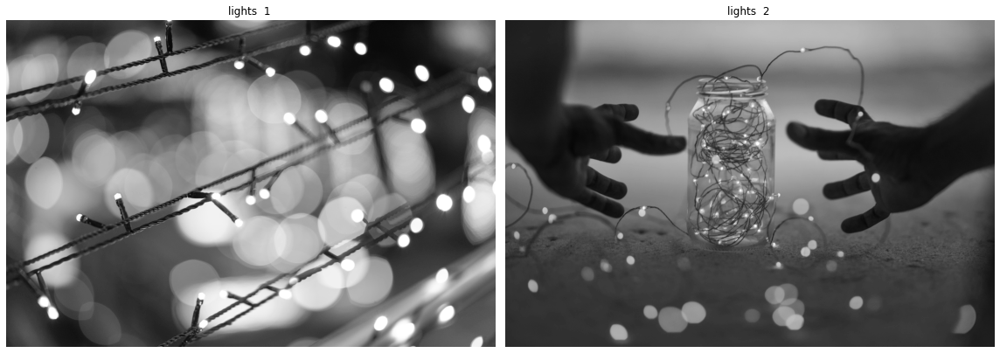

In [3]:
light1 = gray(imread('images/lights.jpg'))
light2 = gray(imread('images/jar.jpg'))
show_images("lights",[light1,light2],[" 1 ", " 2 "],['gray','gray'])

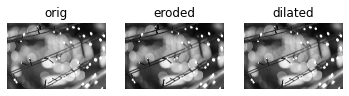

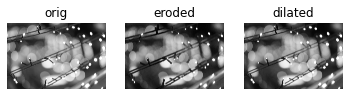

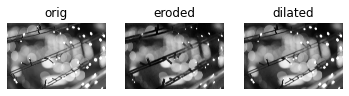

In [ ]:
test_se_sizes(light1,r = range(10,200,30),dtype=double,debug=True)

In [ ]:
test_se_sizes(light2,r = range(10,200,30),dtype=double,debug=True)



#### Explain results
The procedure used here is exactly the same as described above for the oranges
**(it was not needed then , but now it is)**
However, the explanation stays the same, but with grayscale morphological operations.

**Sadly, due to time constraints, I cannot run this before the submission deadline** (it takes way too long )

But it is possible to run it to see the results, I know it works because I tested it before so no waste of time.

When the plot is produced, we can see the spikes represent the sizes of the lights
(just as for the oranges above)
In the first image we can see indeed to bigger spikes, representing the two sizes of lights
present in the image, while in the second one, we have more spikes (due to all the different sized
lights we can see)

## PCA - Recognition


In [1]:
def add_gaussian_noise(img,mu=0.,sigm= 0.15):
    noise = normal(mu,sigm,img.shape) * 255             # adding gaussian noise in spatial domain
    return img + noise
def generate_variations(img):
    # generate and collect 6 variations of an image
    v1 = 255 - img                          # negative point-wise transform
    v2 = quantize(img)                      # color quantization
    v3 = add_gaussian_noise(img)            # gaussian noise spatial domain
    v4 = enhance(img)                       # block-wise color enhancing
    v5 = blur(img)                          # diagonal motion blur
    g = cvtColor(img,COLOR_RGB2GRAY)        # grayscale
    v6 = merge((g,g,g))
    return array([img,v1,v2,v3,v4,v5,v6])   # all variations
def quantize(img):
    # k means color quantization
    m,n,_ = img.shape                                           # image shape
    lab = cvtColor(img, COLOR_RGB2LAB)                          # image in LAB color space
    lab = lab.reshape((m*n, 3))                                 # flatten each color layer
    clt = MiniBatchKMeans(n_clusters=8)                         # find k means clusters
    labels = clt.fit_predict(lab)                               # assign color labels
    quantized = clt.cluster_centers_.astype(uint8)[labels]      # out image
    quantized = quantized.reshape((m,n,3))                      # reshape to given size
    return cvtColor(quantized,COLOR_LAB2RGB)                    # bring back to rgb color space
def enhance(img):
    # block-wise color enhancing
    lab = cvtColor(img,COLOR_RGB2LAB)                           # convert to LAB color space
    l,a,b = split(lab)                                          # splic channels
    clahe = createCLAHE(clipLimit=3.0, tileGridSize=(16,16))    # create color (k,k) clusters
    cl = clahe.apply(l)                                         # filter color blocks
    enhanced = merge((cl,a,b))                                  # merge channels
    return cvtColor(enhanced,COLOR_LAB2RGB)                     # back to rgb color space
def blur(img, a=4, b=4):
    # diagonal motion blur
    # @see diagonal_blur(img)  above
    # @see apply_filter(f,h)  above
    m,n,_ = img.shape
    [u, v] = mgrid[-m/2:m/2, -n/2:n/2]
    u = 2*u/m
    v = 2*v/n
    h = sinc((u*a) + (v*b)) * exp(-1j*pi*((u*a) + (v*b))).astype(double)
    g = zeros(img.shape, uint8)
    for k in range(0,img.shape[2]):
        c = img[:,:,k].astype(uint8)
        fc = fftshift(fft2(c)) * h
        g[:,:,k] = abs(ifft2(ifftshift(fc)))
    return g
def crop(img, t):
    # cropping images to clip faces
    #2048, 1536
    w,h,c = img.shape
    cw = w//6
    ch = h//4
    if t == 1:
        ch = h//8
        cropped= img[ch:-(3*ch), cw:-cw, :]
    else:
        cropped= img[ch:-ch, cw:-cw, :]
    return cropped

#### Generate Dataset with 3 images and 6 variations of each

In [5]:
database = [
    generate_variations(
        crop(rgb(load("P1")),1)                    # i0mage 1, variations 1
    ),
    generate_variations(
        crop(rgb(load("P2")),0)                    # image 2, variations 2
    ),
    generate_variations(
        crop(rgb(load("P3")),0)                    # image 3, variations 3
    )
]

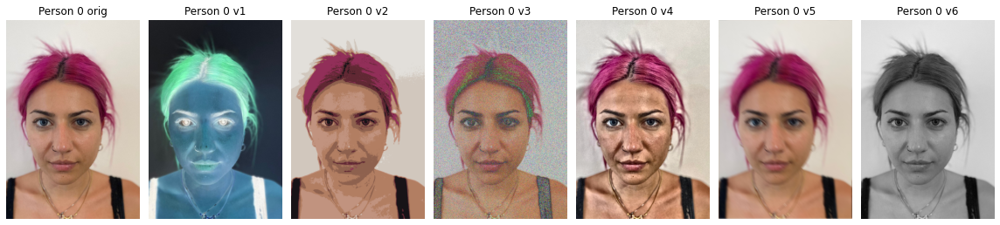

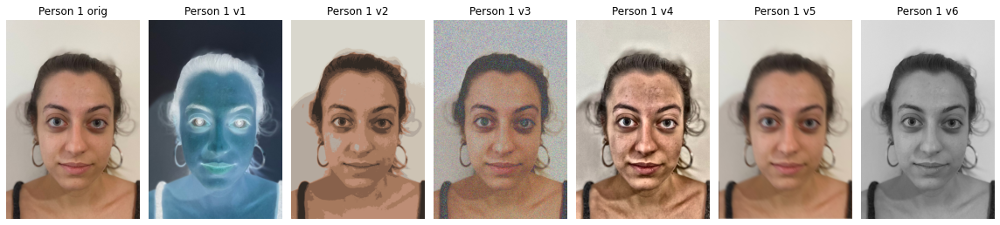

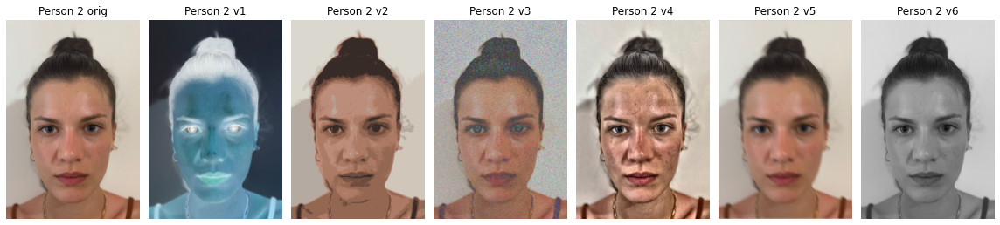

In [6]:
for p in range(len(database)) :                    # show images and variations
    show_images("Person %d"%p, database[p] , ["orig","v1","v2","v3","v4","v5","v6"])

A lot of variations

In [7]:
def flatten(db):
    # construct database for cv2 inbuilt PCACompute
    people = len(db)                                        # number of distinct faces
    images = len(db[0])                                     # number of images (included original and variations)
    m,n,c = (db[0][0]).shape                                # default image shape
    data = zeros((people,images,m*n*c), dtype=float32)      # out dataset structure
    for k in range(people):                                 # loop people
        person_images = db[k]                               # take images from each person
        for i in range(len(person_images)):                 # loop images
            flat = person_images[i].flatten()               # bring image to 1d array
            data[k,i,:] = flat                              # insert to database
    return data, (m,n,c), people,images

In [8]:
database,image_size,num_people,num_images = flatten(database)           # build database for PCA Compute

In [9]:
def compute_pca(db):
    # extract averageFace and eigenFaces
    N_images = vstack((db[0],db[1],db[2]))                   # take all images from all people
    _meanFaces, _eigenVectors = PCACompute(                  # compute PCA
        N_images,                                            # all the dataset
        mean=mean(N_images,axis=0).reshape(1,-1),            # mean of the images sliced
        maxComponents=num_people)                            # one eigenFace for each person in the dataset
    _averageFace = _meanFaces.reshape(image_size)            # averageFace is the mean returned to shape of image
    _eigenFaces = []                                         # out eigenFaces
    l = len(_eigenVectors)                                   # this should be == num_people

    figure(), imshow(_averageFace / 255), title("Average Face"), show()     # show average Face


    figure(figsize=(30,10))                                  # show eigenFaces

    for h in range(l):                                       # loop eigenFaces
        eigenFace = (_eigenVectors[h] * 255).reshape(image_size)            # to image shape (convert to [0,255] range)
        _eigenFaces.append(eigenFace)                                       # append to all
        ef = eigenFace * 10                                                 # display it brighter
        subplot(1,l,h+1), imshow(ef, vmin=min(ef), vmax=max(ef)), axis('off'), title('EigenFace %d'%(h+1))

    tight_layout()
    show()

    return _averageFace, _eigenVectors, _eigenFaces

#### Find the EigenFaces
for each of the 3 faces using their N variations

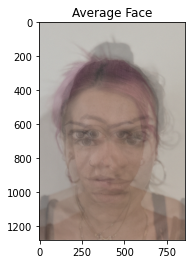

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


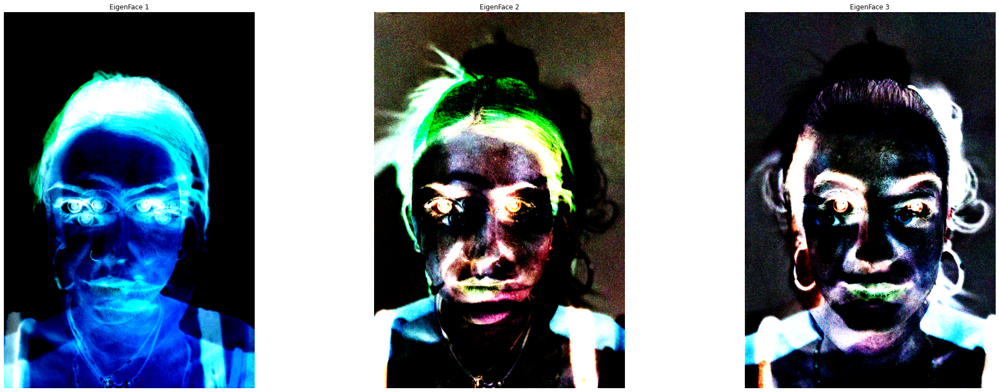

In [10]:
averageFace, eigenVectors, eigenFaces = compute_pca(database)           # compute pca analysis

Can't really tell what's going on here, the values I get in the eigenFaces are really low, while the
mean is way too high
Also, by increasing the number of expected eigenFaces (maxComponents param.), the results start getting super weird (but cool)

#### Reconstruct Faces

In [11]:
def reconstruct_face(_averageFace, _eigenFaces, weights=None):
    # reconstruct face from average face and given reshaped eigenvectors (eigenFaces)
    if weights is None:  weights = [255, 255, 255]                          # EigenFaces weights
    reconstructed = zeros(_averageFace.shape)                               # out image

    if len(_eigenFaces.shape) > 3:                                          # if more than one eigenface is provided
        for i in range(len(_eigenFaces)):                                       # loop eigenfaces
            reconstructed = add(reconstructed, _eigenFaces[i] * weights[i])     # sum weighted product of eigenFaces with average image
    else:                                                                   # one eigenFace only
        reconstructed = add(reconstructed, _eigenFaces * weights[0])        # sum weighted product of one eigenFace with average image

    reconstructed = resize(reconstructed, (0,0), fx = 2, fy = 2)            # rescale reconstructed to double the size
    return reconstructed

**Using all EigenFaces**

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


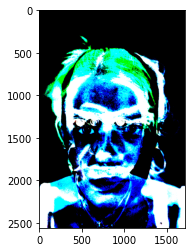

(<Figure size 432x288 with 1 Axes>,
 None)

In [12]:
combined = reconstruct_face(averageFace, array(eigenFaces),[255,255,255])       # reconstruct from all eigenFaces
figure(), imshow(combined), show()

Using another small number of eigenFaces

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


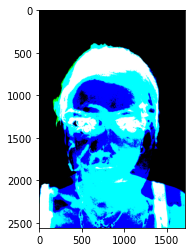

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


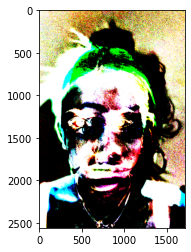

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


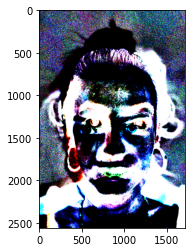

In [13]:
for p in range(num_people):
    single = reconstruct_face(averageFace, array(eigenFaces[p]),[255])          # reconstruct from each eigenFace singularly
    figure(), imshow(single), show()

Attempt to re-create the slider-weighted reconstruction in this [tutorial](https://learnopencv.com/eigenface-using-opencv-c-python/)

In [14]:
def create_new_face(*args):
    # reconstruct face from weighted sum of eigenFaces
    out = averageFace                                   # out reconstructed

    for i in range(len(sliderValues)):                  # for each slider
        sliderValues[i] = getTrackbarPos("W" + str(i), "Trackbars")     # slider gives the weight for each face
        weight = sliderValues[i] - MAX_SLIDER_VALUE//2                  # gather slider weight value
        out = add(out, eigenFaces[i] * weight)                          # sum product of weight with eigenFace to the averageImage

    out = resize(out/255, (500,500), fx=2, fy=2)                        # rescale to [0,1] for cv2.imshow
    cv2.imshow("Result", out)                                           # display

def reset_sliders(*args):
    # reset slider values to default
    for i in range(len(sliderValues)):
        sliderValues[i] = MAX_SLIDER_VALUE//2

In [ ]:
MAX_SLIDER_VALUE = 255
namedWindow("Average",WINDOW_AUTOSIZE )                         # average face
namedWindow("Result", WINDOW_AUTOSIZE)                          # result of reconstruction
output = resize(averageFace / 255 , (500,500), fx=2, fy=2)      # rescale to [0,1] range for cv2.imshow
cv2.imshow("Average", output)
cv2.imshow("Result", output)
namedWindow("Trackbars", WINDOW_AUTOSIZE)                       # sliders window
sliderValues = []

for p in range(num_people):                                     # loop eigenFaces
    sliderValues.append(MAX_SLIDER_VALUE//2)                    # init slider for each eigenface
    createTrackbar("W" + str(p), "Trackbars", MAX_SLIDER_VALUE//2, MAX_SLIDER_VALUE, create_new_face)       # add on update function

setMouseCallback("Result", reset_sliders)                       # add on callback function
waitKey(0)
destroyAllWindows()

It is real fun to see how changing the weights with the sliders gives back the actual faces given in the beginning
This happens when we subtract (negative weight) all the other faces, and we add (positive weight) the ones we are looking for.
However, mixing more eigenFaces, doesn't really give nice mixed face.
I might expect this to be due either to the low amount of faces in the dataset, or either the non perfect centering of the faces
Or whatever, there is a lot of things which may have gone wrong here and there :==(